In [1]:
!nvidia-smi

Mon Nov  3 21:38:25 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8             10W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**Import And Split**


In [2]:
# ============================================================
# 0. Setup
# ============================================================
!pip install -q ultralytics

from ultralytics import YOLO
from pathlib import Path
import yaml, shutil, random, xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Dataset paths
BASE  = Path("/kaggle/input/bangladesh-traffic/Bangladeshi Traffic Flow Dataset/Annotated Images")
WORK  = Path("/kaggle/working/traffic_baseline")
SPLIT = WORK / "yolo_split"
DATA  = WORK / "data_traffic.yaml"
WORK.mkdir(parents=True, exist_ok=True)

# Custom folder for all outputs
OUTPUT_FOLDER = Path("/kaggle/working/base_yolov12")
OUTPUT_FOLDER.mkdir(parents=True, exist_ok=True)

# ============================================================
# 1. VOC → YOLO conversion + train/val/test split
# ============================================================
def voc2yolo(xml_file, classes, out_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    size = root.find("size")
    w, h = int(size.find("width").text), int(size.find("height").text)

    with open(out_file, "w") as f:
        for obj in root.iter("object"):
            cls = obj.find("name").text
            if cls not in classes:
                continue
            cls_id = classes.index(cls)

            xmlbox = obj.find("bndbox")
            xmin, ymin = float(xmlbox.find("xmin").text), float(xmlbox.find("ymin").text)
            xmax, ymax = float(xmlbox.find("xmax").text), float(xmlbox.find("ymax").text)

            x = (xmin + xmax) / 2.0 / w
            y = (ymin + ymax) / 2.0 / h
            bw = (xmax - xmin) / w
            bh = (ymax - ymin) / h
            f.write(f"{cls_id} {x:.6f} {y:.6f} {bw:.6f} {bh:.6f}\n")

def create_split(all_files, ratios=(0.7,0.2,0.1)):
    n = len(all_files)
    n_train = int(ratios[0]*n)
    n_val   = int(ratios[1]*n)
    random.shuffle(all_files)
    return (all_files[:n_train],
            all_files[n_train:n_train+n_val],
            all_files[n_train+n_val:])

def convert_and_split(base_dir, classes, ratios=(0.7,0.2,0.1)):
    if SPLIT.exists():
        shutil.rmtree(SPLIT)

    all_pairs = []
    for ext in ["*.jpg","*.jpeg","*.png","*.JPG","*.JPEG","*.PNG"]:
        for img_file in Path(base_dir).rglob(ext):
            xml_file = img_file.with_suffix(".xml")
            if xml_file.exists():
                all_pairs.append((img_file, xml_file))

    print(f"Found {len(all_pairs)} annotated images total.")
    train, val, test = create_split(all_pairs, ratios)
    splits = {"train":train, "val":val, "test":test}

    for split_name, files in splits.items():
        out_im, out_lb = SPLIT/split_name/"images", SPLIT/split_name/"labels"
        out_im.mkdir(parents=True, exist_ok=True)
        out_lb.mkdir(parents=True, exist_ok=True)

        for img_file, xml_file in files:
            shutil.copy(img_file, out_im/img_file.name)
            voc2yolo(xml_file, classes, out_lb/f"{img_file.stem}.txt")
        print(f"{split_name}: {len(files)} images")

# Classes in dataset
CLASSES = ["Rickshaw","Bus","Truck","Bike","Mini-truck","People","Car","CNG","Cycle"]

print("➤ Converting Pascal VOC → YOLO with auto split …")
convert_and_split(BASE, CLASSES, ratios=(0.7,0.2,0.1))

# Create data.yaml for YOLOv12
DATA.write_text(yaml.dump({
    "path": str(SPLIT),
    "train": "train/images",
    "val": "val/images",
    "test": "test/images",
    "nc": len(CLASSES),
    "names": CLASSES
}))
print("✓ YOLO split ready:", DATA)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.3 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 87.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 65.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 70.7 MB/s eta 0:00:00:00:0100:01
Creating new Ultralyti

In [3]:
from tqdm.auto import tqdm

import os
import requests
import zipfile
import cv2
import math
import matplotlib.pyplot as plt
import glob
import numpy as np
import random
import seaborn as sns
import pandas as pd 
from collections import Counter
import yaml
from PIL import Image
import shutil

**Train Yolo Baseline**

In [4]:
# Load the YAML file
yaml_path = "/kaggle/working/traffic_baseline/data_traffic.yaml"  # Update this
with open(yaml_path, "r") as f:
    data_yaml = yaml.safe_load(f)

# Extract class names
class_names = data_yaml["names"]
num_classes = data_yaml["nc"]

print(f"Number of classes: {num_classes}")
print(f"Class names: {class_names}")

Number of classes: 9
Class names: ['Rickshaw', 'Bus', 'Truck', 'Bike', 'Mini-truck', 'People', 'Car', 'CNG', 'Cycle']


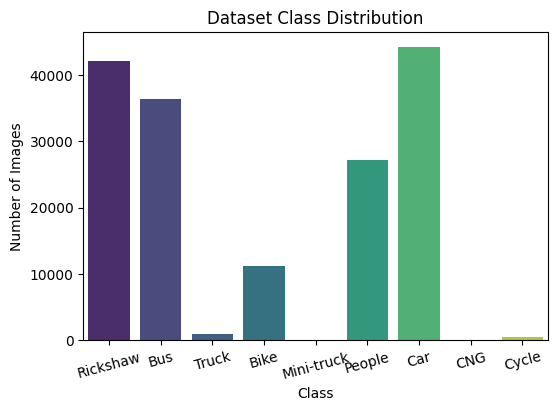

In [5]:
# Define paths
base_path = "/kaggle/working/traffic_baseline/yolo_split/train/labels"  # Update this

# Count occurrences of each class in the dataset
class_counts = {name: 0 for name in class_names}

for label_file in os.listdir(base_path):
    with open(os.path.join(base_path, label_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            class_idx = int(line.split()[0])  # Get class index
            class_counts[class_names[class_idx]] += 1
class_counts_df = pd.DataFrame(class_counts.items(), columns=["Class", "Count"])

# Plot class distribution
plt.figure(figsize=(6, 4))
sns.barplot(data=class_counts_df, x="Class", y="Count", palette="viridis")
plt.title("Dataset Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=15)
plt.show()

In [6]:
import os
import collections

# Define paths
label_dir = "/kaggle/working/traffic_baseline/yolo_split/train/labels"

# Count labels per class
class_counts = collections.defaultdict(int)

# Read label files
for label_file in os.listdir(label_dir):
    with open(os.path.join(label_dir, label_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            class_id = int(line.split()[0])  # Extract class ID (assuming first value in YOLO format)
            class_counts[class_id] += 1

# Print class distribution
print("Class Distribution Before Balancing:")
for class_id, count in sorted(class_counts.items()):
    print(f"Class {class_id}: {count} images")

# Find the target count (max of any class)
target_count = min(class_counts.values())
print(f"\nTarget count for all classes: {target_count}")

Class Distribution Before Balancing:
Class 0: 42165 images
Class 1: 36381 images
Class 2: 944 images
Class 3: 11192 images
Class 5: 27126 images
Class 6: 44232 images
Class 8: 483 images

Target count for all classes: 483


In [7]:
import shutil
import random

# Define paths
train_images_dir = "/kaggle/working/traffic_baseline/yolo_split/train/images"
train_labels_dir = "/kaggle/working/traffic_baseline/yolo_split/train/labels"

# Target count (smallest class count)
target_count = min(class_counts.values())  # 503 in this case

# Get all class 0 files
class_0_files = []
for lbl_file in os.listdir(train_labels_dir):
    with open(os.path.join(train_labels_dir, lbl_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            if int(line.split()[0]) == 0:  # Check if it's Class 0
                class_0_files.append(lbl_file)
                break  # Only need to check the first line

# Randomly select Class 0 files to keep
files_to_keep = set(random.sample(class_0_files, target_count))
files_removed = []

# Remove extra files
for lbl_file in class_0_files:
    if lbl_file not in files_to_keep:
        img_file = lbl_file.replace(".txt", ".jpg")

        src_label = os.path.join(train_labels_dir, lbl_file)
        src_image = os.path.join(train_images_dir, img_file)

        # Move to a backup folder instead of deleting (optional)
        backup_dir = "/kaggle/working/removed_samples"
        os.makedirs(backup_dir, exist_ok=True)
        shutil.move(src_label, os.path.join(backup_dir, lbl_file))
        shutil.move(src_image, os.path.join(backup_dir, img_file))

        files_removed.append(lbl_file)

print("\n✅ **Undersampling Completed!**")
print(f"🗑 Removed {len(files_removed)} files from Class 0")


✅ **Undersampling Completed!**
🗑 Removed 13152 files from Class 0


In [8]:
# Recalculate class distribution after undersampling
from collections import Counter
import os

train_labels_dir = "/kaggle/working/traffic_baseline/yolo_split/train/labels"

final_class_counts = Counter()
for lbl_file in os.listdir(train_labels_dir):
    with open(os.path.join(train_labels_dir, lbl_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            class_id = int(line.split()[0])  # Extract class ID
            final_class_counts[class_id] += 1

print("\n✅ **Final Class Distribution After Undersampling:**")
for class_id, count in final_class_counts.items():
    print(f"Class {class_id}: {count} images")


✅ **Final Class Distribution After Undersampling:**
Class 6: 8634 images
Class 1: 5158 images
Class 5: 2909 images
Class 3: 1745 images
Class 0: 1569 images
Class 2: 281 images
Class 8: 68 images


In [9]:
import yaml

# Path to data.yaml in the working directory
yaml_path = "/kaggle/working/traffic_baseline/data_traffic.yaml"

# Load the existing YAML file
with open(yaml_path, "r") as file:
    data = yaml.safe_load(file)

# Add/Modify augmentation settings (YOLOv12 supports these augmentations)
data["augment"] = {
    "mosaic": True,
    "mixup": 0.2,
    "hsv_h": 0.015,
    "hsv_s": 0.7,
    "hsv_v": 0.4,
    "perspective": 0.0005,
    "shear": 0.0001,
    "flipud": 0.5,
    "fliplr": 0.5,
    "rotate": 5.0,
    "scale": 0.5
}

# Save the updated YAML file
with open(yaml_path, "w") as file:
    yaml.dump(data, file, default_flow_style=False)

print("✅ `data.yaml` updated successfully with on-the-fly augmentations!")

✅ `data.yaml` updated successfully with on-the-fly augmentations!


✅ Image loaded successfully!


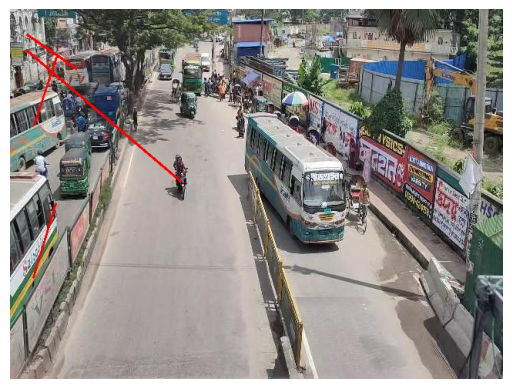

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_path = "/kaggle/working/traffic_baseline/yolo_split/train/images/frame0_jpg.rf.1038d1fadaf090feae4bb9ac1aff7153.jpg"
label_path = img_path.replace("images", "labels").replace(".jpg", ".txt")
# Ensure the image exists before processing
if os.path.exists(img_path):
    img = cv2.imread(img_path)
    
    if img is not None:  # Check if image is successfully read
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        print("✅ Image loaded successfully!")
    else:
        print("⚠️ Error: Image could not be loaded. Possible corruption:", img_path)
else:
    print("❌ Image path does not exist:", img_path)
# Example: Load an image and overlay its polygon annotation


# Read image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Read annotations
with open(label_path, "r") as f:
    lines = f.readlines()

for line in lines:
    values = list(map(float, line.split()))
    class_id = int(values[0])
    polygon = values[1:]  # Polygon coordinates

    # Convert YOLO polygon format to image points
    points = [(int(polygon[i] * img.shape[1]), int(polygon[i+1] * img.shape[0])) for i in range(0, len(polygon), 2)]
    
    # Draw polygon
    cv2.polylines(img, [np.array(points)], isClosed=True, color=(255, 0, 0), thickness=2)

# Show image with annotations
plt.imshow(img)
plt.axis("off")
plt.show()

In [11]:
import yaml

# Define the correct paths for your dataset
data_yaml_path = "/kaggle/working/traffic_baseline/data_traffic.yaml"  # Save in working directory

correct_paths = {
    "train": "/kaggle/working/traffic_baseline/yolo_split/train/images",  # Update this path
    "val": "/kaggle/working/traffic_baseline/yolo_split/val/images",  # Update this path
    "test": "/kaggle/working/traffic_baseline/yolo_split/test",  # Update this path
    "nc": 9,  # Number of classes
    "names": ['Rickshaw', 'Bus', 'Truck', 'Bike', 'Mini-truck', 'People', 'Car', 'CNG', 'Cycle']  # Class names
}

# Save the updated data.yaml
with open(data_yaml_path, "w") as file:
    yaml.dump(correct_paths, file, default_flow_style=False)

print(f"✅ Updated data.yaml saved at: {data_yaml_path}")

✅ Updated data.yaml saved at: /kaggle/working/traffic_baseline/data_traffic.yaml


In [12]:
pip install ultralytics

Note: you may need to restart the kernel to use updated packages.


In [13]:
from ultralytics import YOLO
model = YOLO("yolo12s.pt")

In [14]:
import torch
import time
from ultralytics import YOLO

# Clear cache before training
torch.cuda.empty_cache()


In [15]:
#UPDATED

import time

# Start time
start_time = time.time()

import time

# Start time
start_time = time.time()

# Train the model with incremental saving every 10 epochs, larger batch, and both GPUs
results = model.train(
   data='/kaggle/working/traffic_baseline/data_traffic.yaml',
   imgsz=640,
   epochs=50,
   batch=32,        # increased batch size for faster training
   name='yolo12s.pt',
   save_period=10,  # saves checkpoint every 10 epochs
   device='0,1'     # use both T4 GPUs
)

# End time
end_time = time.time()

# Calculate total time taken
total_time = end_time - start_time
minutes = int(total_time // 60)
seconds = int(total_time % 60)

# Display training summary
print(f"✅ Training Completed!")
print(f"🕒 Time Taken: {minutes} min {seconds} sec")
print(f"🔄 Total Epochs: {results.epochs}")


Ultralytics 8.3.224 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                       CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/traffic_baseline/data_traffic.yaml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo12s.pt, nbs=64, nms=False, ops

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       4735      46468      0.608      0.643      0.653      0.417
              Rickshaw       3872      12059      0.764      0.736       0.81      0.519
                   Bus       3881      10374       0.71      0.847      0.835      0.551
                 Truck        230        254      0.342      0.374      0.324      0.249
                  Bike       2100       3136      0.705      0.761      0.793      0.443
                People       2963       7927        0.7      0.783      0.805      0.466
                   Car       4270      12573      0.778      0.873      0.899      0.644
                 Cycle        138        145      0.259      0.124      0.106     0.0461
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/runs/detect/yolo12s.pt
✅ Training Completed!
🕒 Time Taken: 62 min 25 sec


AttributeError: 'NoneType' object has no attribute 'epochs'

In [27]:
import shutil

# Define the folder path and output ZIP file
source_folder = "/kaggle/working/runs/detect/yolo12s.pt"  # Folder you want to zip
zip_path = "/kaggle/working/yolo12s.zip"  # Output ZIP file

# Create the ZIP file
shutil.make_archive(zip_path.replace(".zip", ""), 'zip', source_folder)

print(f"✅ ZIP file successfully created: {zip_path}")

✅ ZIP file successfully created: /kaggle/working/yolo12s.zip


In [22]:
from pathlib import Path

zip_path = Path("/kaggle/output/yolo12s.zip")
print("Exists:", zip_path.exists())


Exists: True


In [25]:
from pathlib import Path

# Start searching from /kaggle/working and /kaggle/output
search_paths = ["/kaggle/working", "/kaggle/output"]

# Name of the file you are looking for
file_name = "yolo12s.zip"

# Search recursively
found_files = []
for path in search_paths:
    for f in Path(path).rglob(file_name):
        found_files.append(f.resolve())

if found_files:
    print("✅ Found the file at:")
    for f in found_files:
        print(f)
else:
    print("❌ File not found")


✅ Found the file at:
/kaggle/output/yolo12s.zip


In [17]:
# Move ZIP file to Kaggle Output & create clickable link

from pathlib import Path
import shutil
from IPython.display import display, HTML

# Path to the existing ZIP
zip_path = Path("/kaggle/working/yolo12s.zip")

# Kaggle persistent output folder
output_folder = Path("/kaggle/output/")
output_folder.mkdir(exist_ok=True)  # ensure folder exists

# Move the ZIP to /kaggle/output/
dest_path = output_folder / zip_path.name
shutil.move(str(zip_path), str(dest_path))

print(f"✅ ZIP file successfully moved to Kaggle Output folder: {dest_path}")

# Create a clickable download link with custom text
display(HTML(f'<a href="{dest_path}" target="_blank">📥 Click here to download the ZIP file</a>'))


✅ ZIP file successfully moved to Kaggle Output folder: /kaggle/output/yolo12s.zip


In [28]:
# ................

from pathlib import Path
import shutil

# Source ZIP in Kaggle Output
zip_src = Path("/kaggle/output/yolo12s.zip")

# Destination in /kaggle/working/
zip_dest = Path("/kaggle/working/yolo12s.zip")

# Copy the ZIP
shutil.copy2(zip_src, zip_dest)

print(f"✅ ZIP successfully copied to: {zip_dest}")


✅ ZIP successfully copied to: /kaggle/working/yolo12s.zip


In [29]:
from ultralytics import YOLO

# Load your trained YOLOv12 model
model = YOLO("/kaggle/working/runs/detect/yolo12s.pt/weights/best.pt")

# Run validation on the test/valid dataset
metrics = model.val(data="/kaggle/working/traffic_baseline/data_traffic.yaml")

# Print all metrics
print("\n📊 **Full YOLO Model Evaluation Report:**")
print(metrics)

Ultralytics 8.3.224 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,234,363 parameters, 0 gradients, 21.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1719.1±411.3 MB/s, size: 67.9 KB)
val: Scanning /kaggle/working/traffic_baseline/yolo_split/val/labels.cache... 4735 images, 7 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 4735/4735 7.1Mit/s 0.0s0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 296/296 4.6it/s 1:05<0.2ss


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       4735      46468      0.607      0.643      0.653      0.417
              Rickshaw       3872      12059      0.763      0.736       0.81      0.519
                   Bus       3881      10374       0.71      0.848      0.835      0.551
                 Truck        230        254      0.343      0.374      0.324      0.249
                  Bike       2100       3136      0.705      0.762      0.793      0.444
                People       2963       7927      0.699      0.783      0.805      0.466
                   Car       4270      12573      0.777      0.873      0.899      0.644
                 Cycle        138        145       0.25      0.124      0.106     0.0462
Speed: 0.8ms preprocess, 9.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/runs/detect/val

📊 **Full YOLO Model Evaluation Report:**
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5, 6, 8])
box: ult

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 1000x600 with 0 Axes>

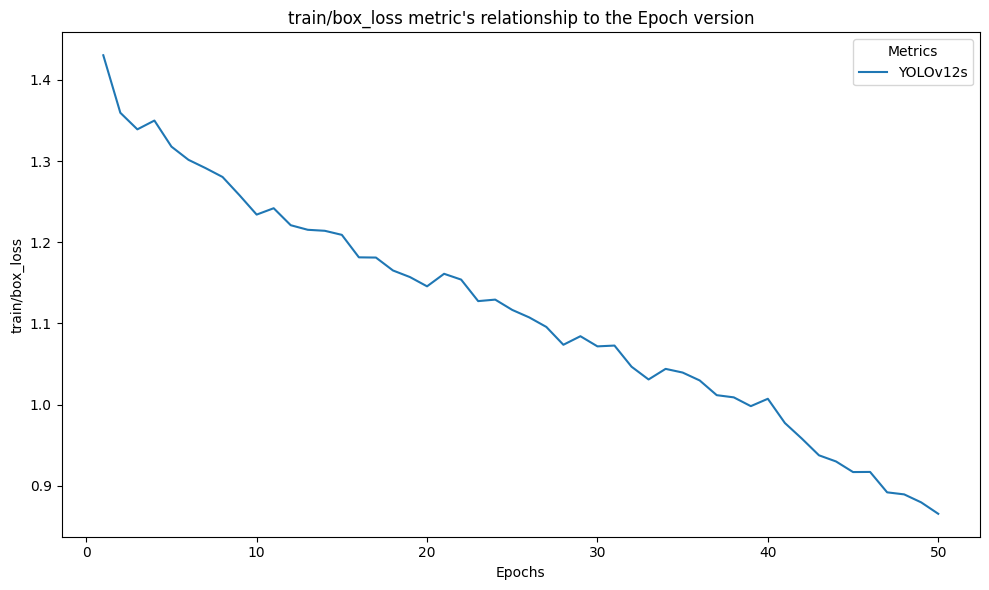

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


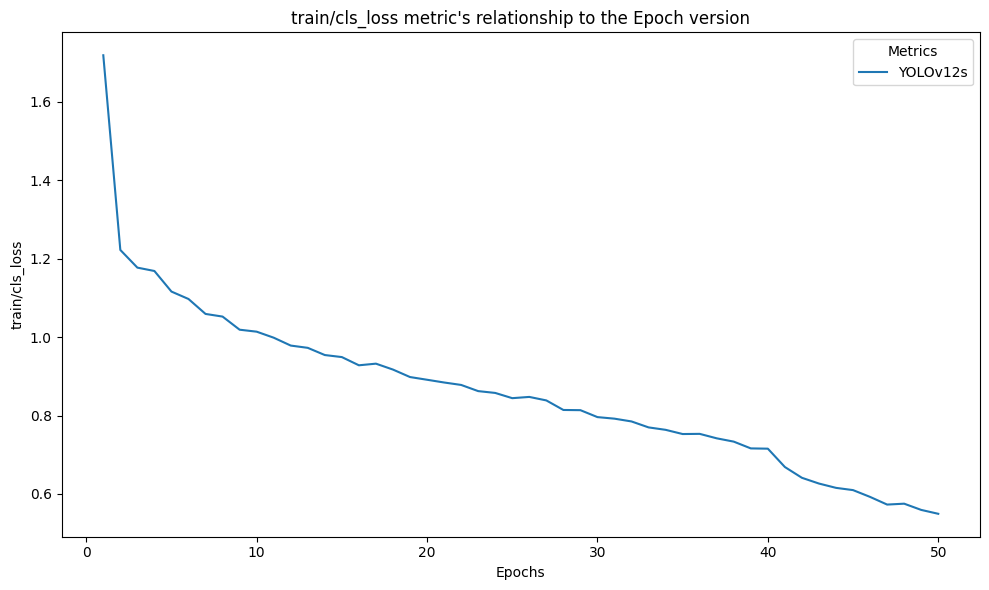

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


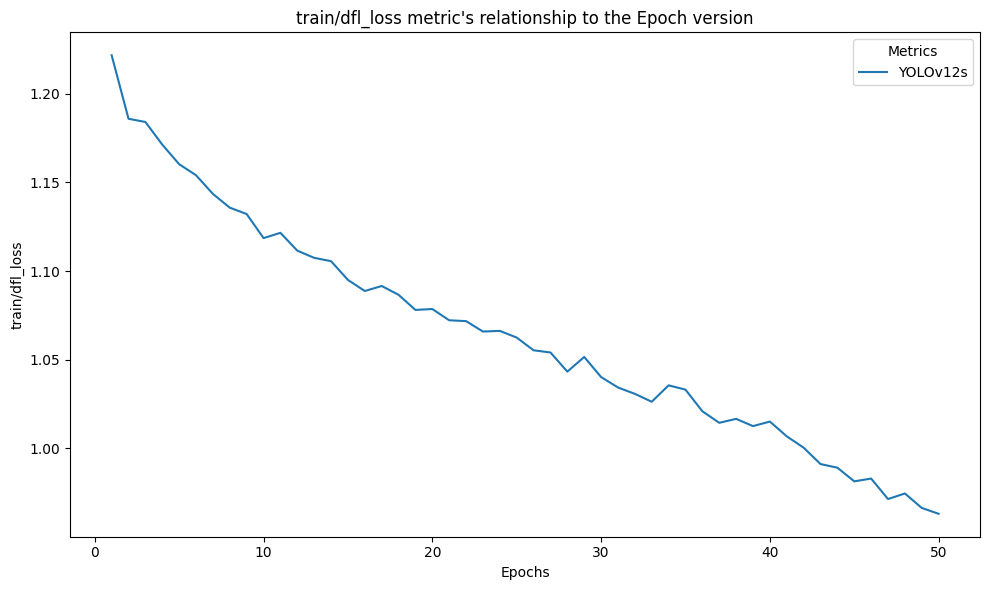

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


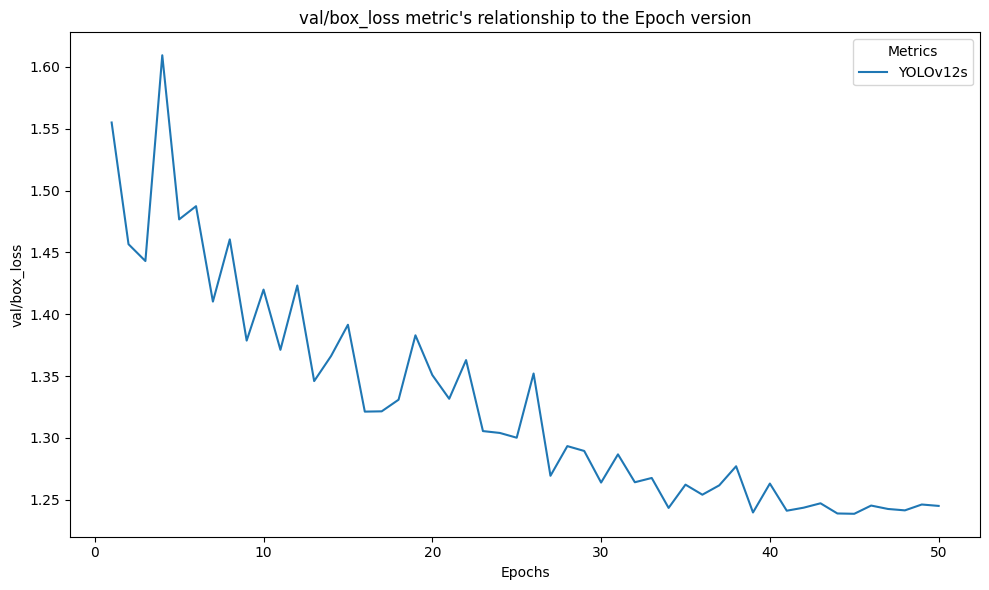

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


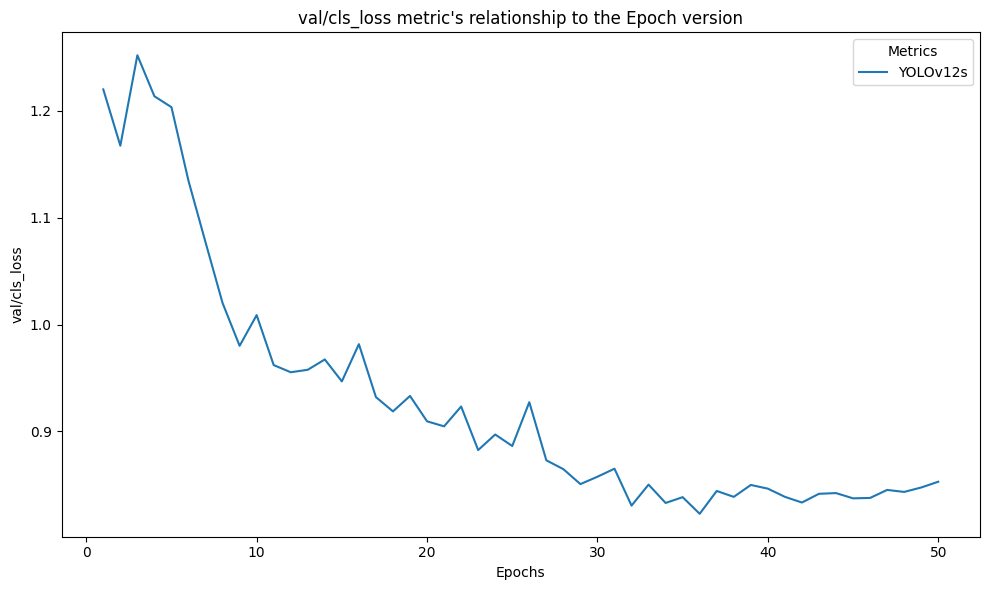

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


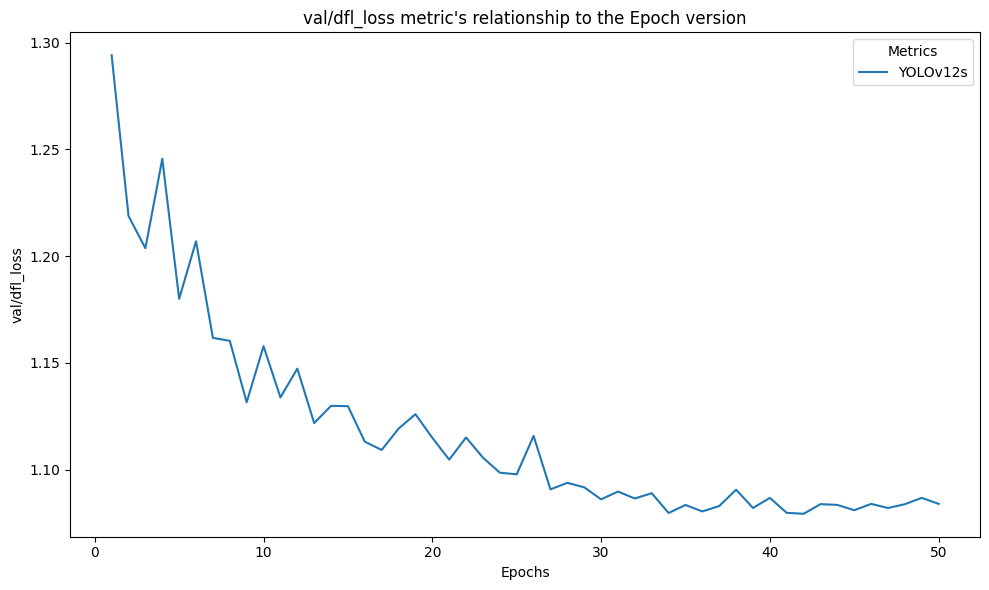

In [30]:
import pandas as pd
import seaborn as sns 

df = pd.read_csv('/kaggle/working/runs/detect/yolo12s.pt/results.csv')

metrics = ['train/box_loss','train/cls_loss','train/dfl_loss','val/box_loss','val/cls_loss','val/dfl_loss']

plt.figure(figsize=(10, 6))

for metric in metrics:
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='epoch', y=metric, data=df, label="YOLOv12s")
    
    plt.title(f"{metric} metric's relationship to the Epoch version")
    plt.xlabel("Epochs")
    plt.ylabel(f"{metric}")
    plt.legend(title="Metrics")
    plt.tight_layout()
    
    plt.show()

**Evaluate**

In [31]:
paths2=[]
for dirname, _, filenames in os.walk('/kaggle/working/runs/detect/val'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            paths2+=[(os.path.join(dirname, filename))]
paths2=sorted(paths2)
print(len(paths2))
print(paths2[0:3])

12
['/kaggle/working/runs/detect/val/BoxF1_curve.png', '/kaggle/working/runs/detect/val/BoxPR_curve.png', '/kaggle/working/runs/detect/val/BoxP_curve.png']


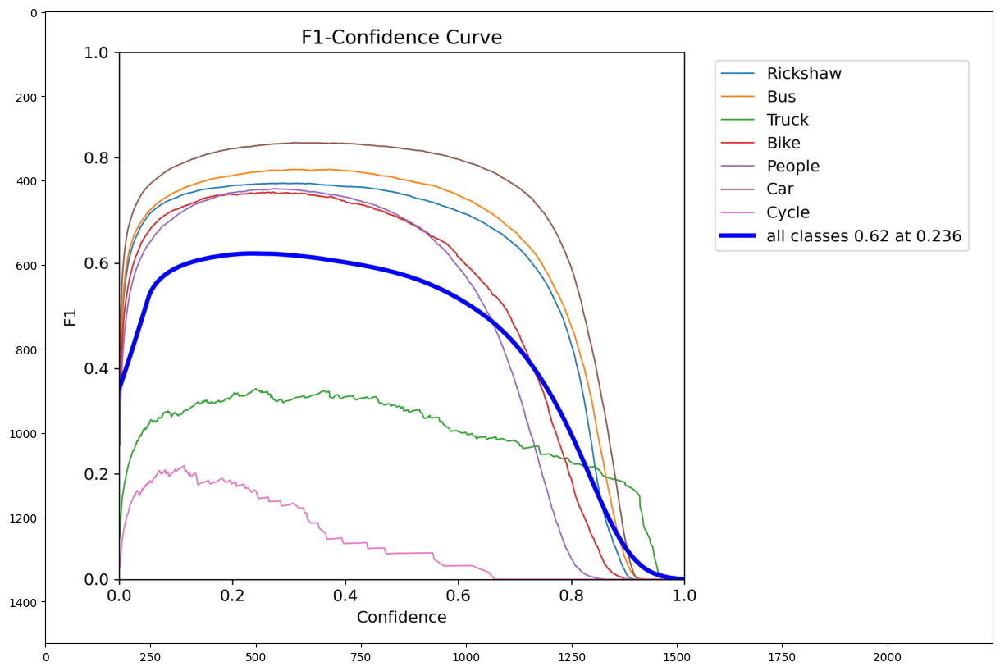

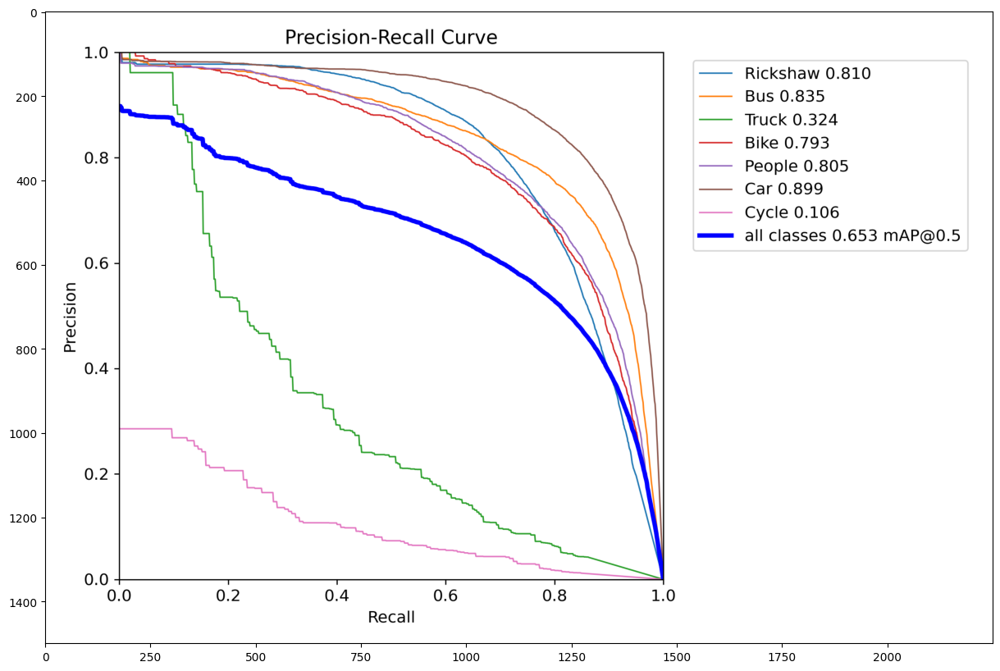

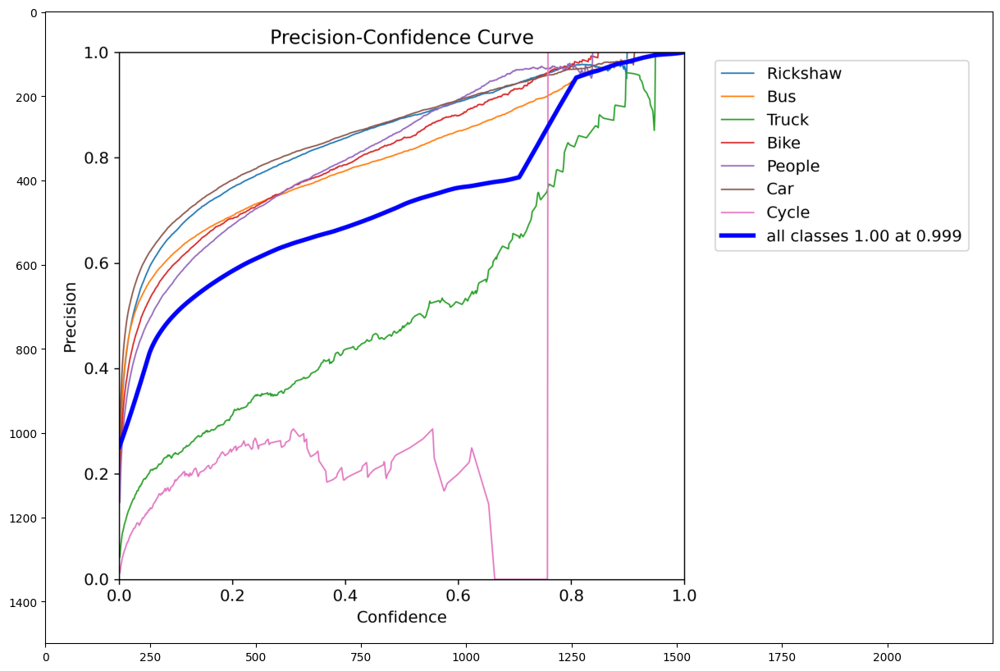

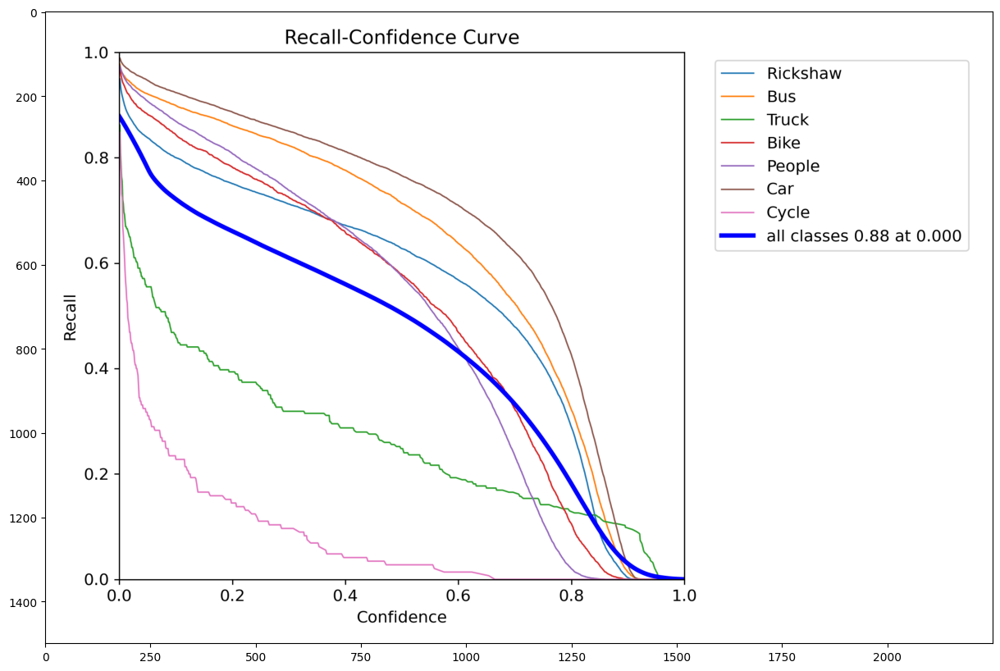

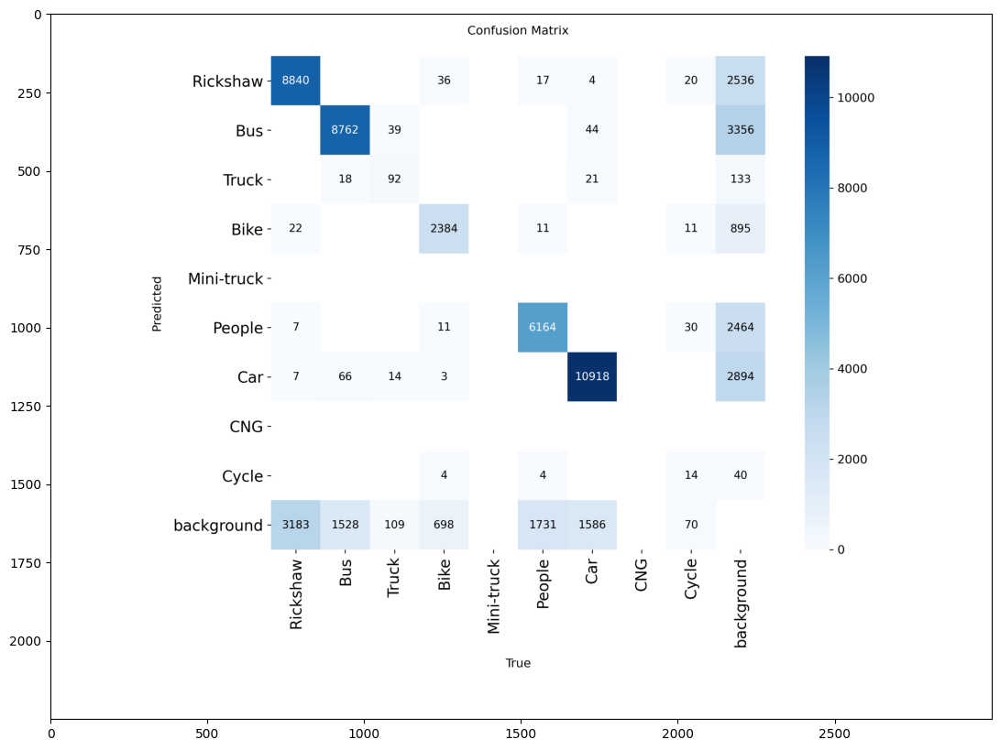

...

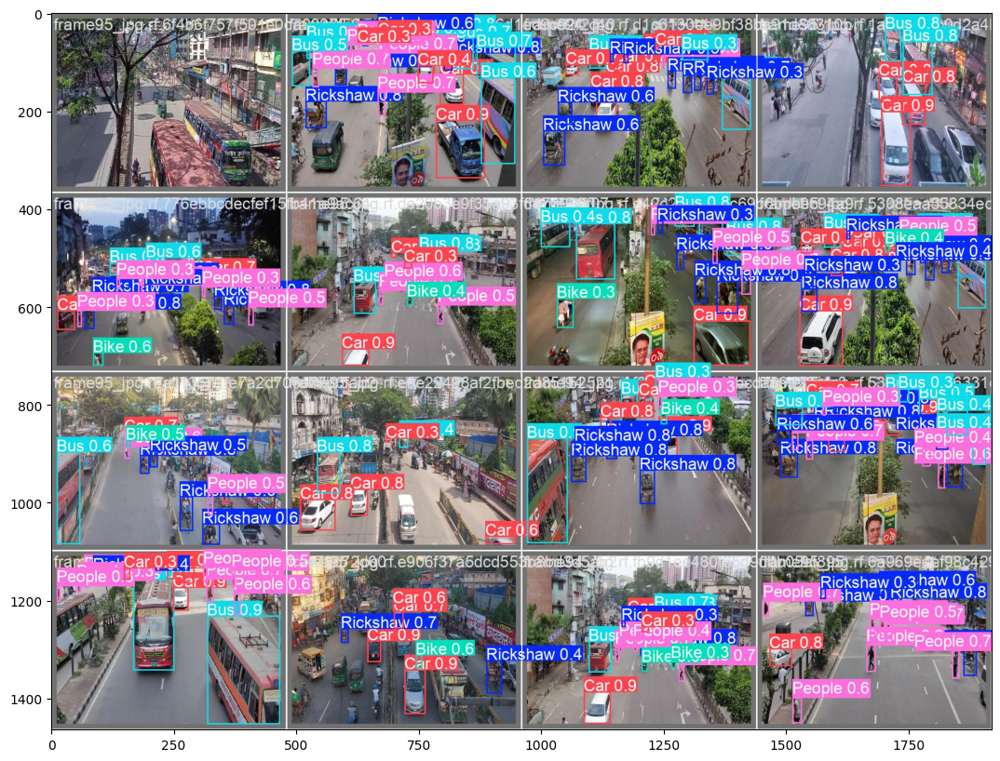

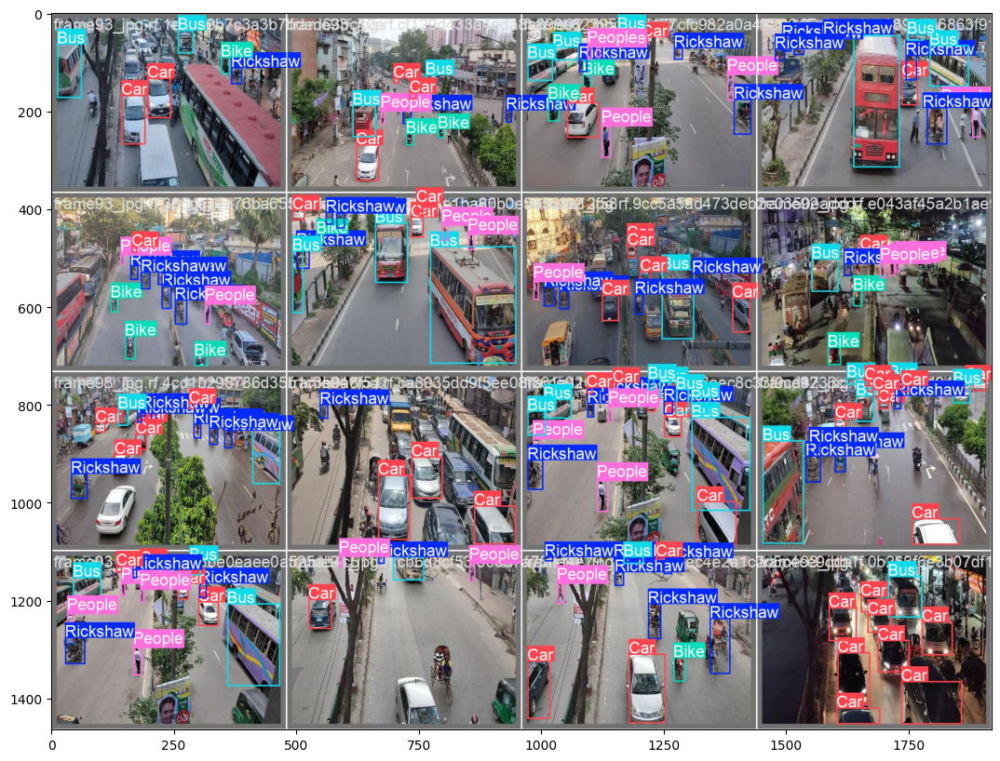

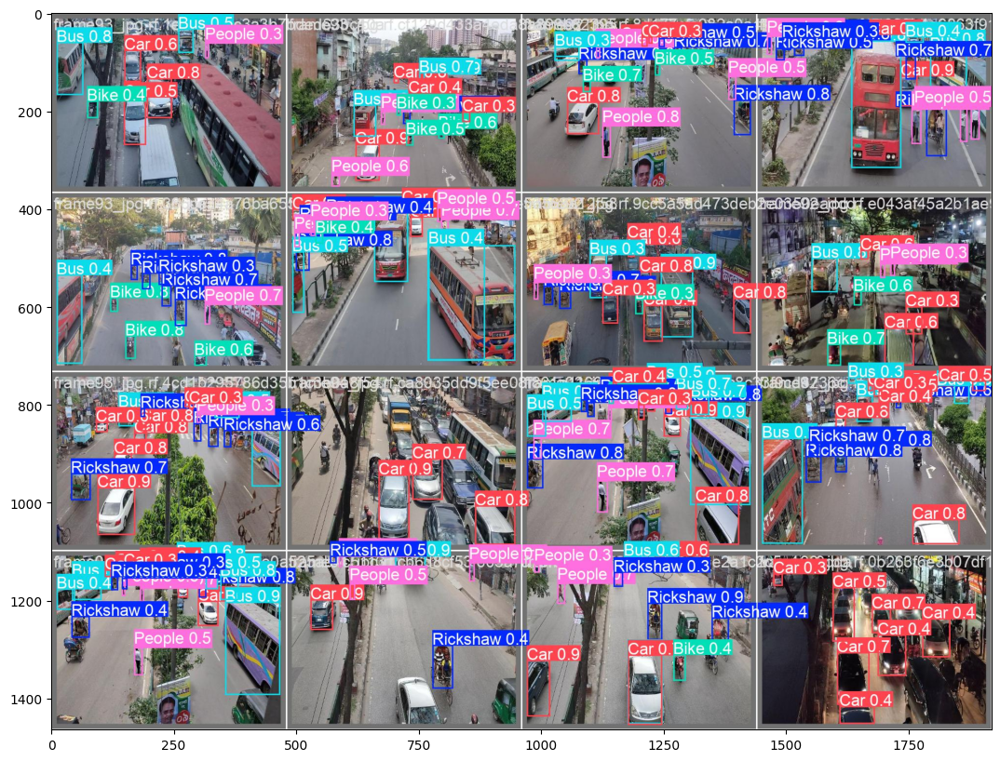

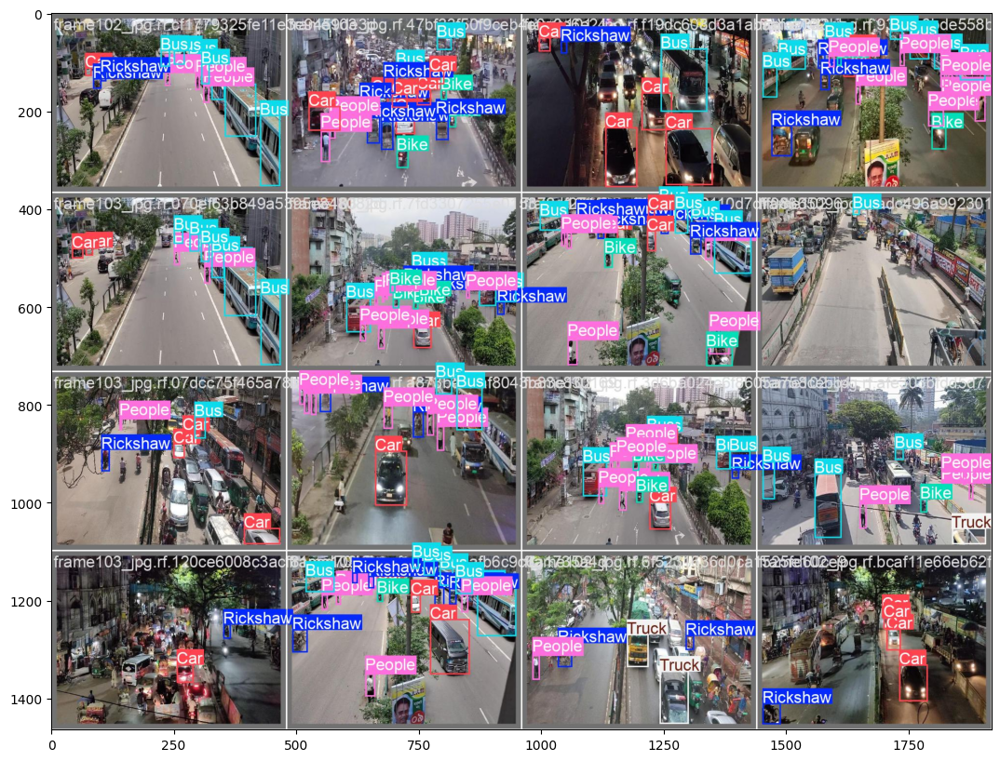

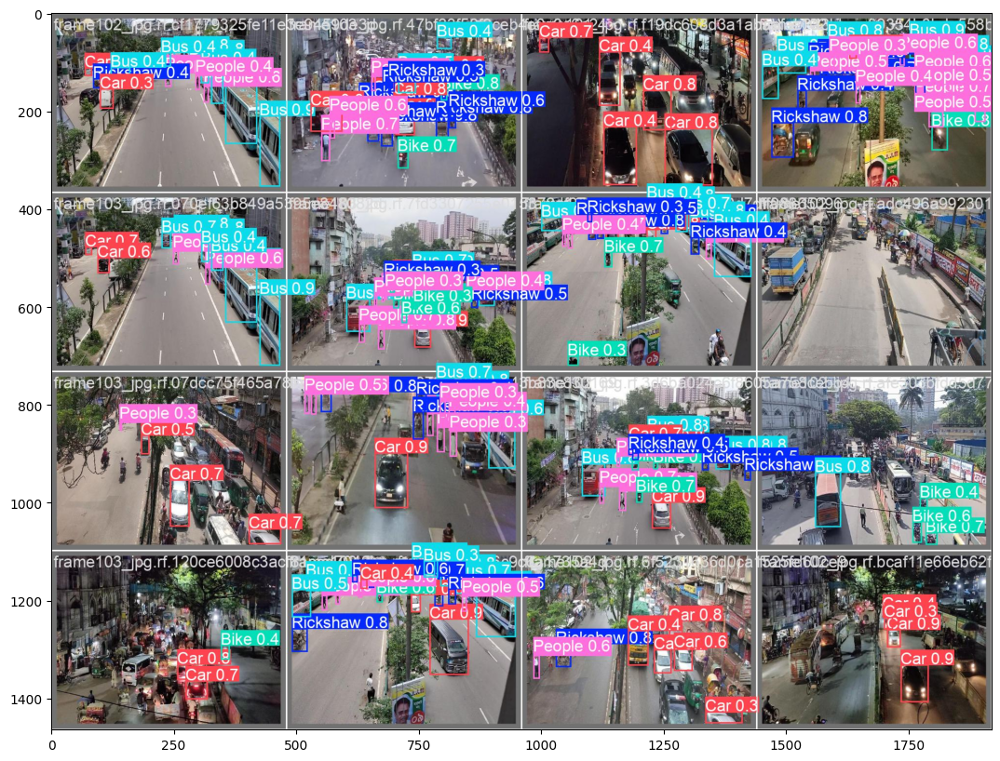

In [32]:
for path in paths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()

In [33]:
# ============================================================
# 3. Evaluate on test set + generate plots (outputs in same folder)
# ============================================================
metrics = model.val(
    data=str(DATA),
    split="test",
    plots=True,
    project=str(OUTPUT_FOLDER),  # <- same output folder
    name="val"
)

print("mAP@0.5     :", metrics.box.map50)
print("mAP@[.5:.95]:", metrics.box.map)
print("Precision   :", metrics.box.mp)
print("Recall      :", metrics.box.mr)

Ultralytics 8.3.224 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1658.9±413.4 MB/s, size: 74.5 KB)
val: Scanning /kaggle/working/traffic_baseline/yolo_split/test/labels... 2369 images, 6 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2369/2369 1.3Kit/s 1.8s0.0s
val: New cache created: /kaggle/working/traffic_baseline/yolo_split/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 149/149 4.3it/s 34.3s0.2ss


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       2369      23050      0.615      0.652      0.667      0.428
              Rickshaw       1930       6017      0.757      0.736      0.806      0.515
                   Bus       1941       5241      0.709      0.835      0.834      0.549
                 Truck         99        112      0.327      0.402      0.345      0.275
                  Bike       1042       1566      0.711      0.751      0.781      0.442
                People       1441       3726        0.7      0.781      0.814      0.467
                   Car       2121       6302      0.778      0.875      0.903      0.646
                 Cycle         84         86      0.321      0.186      0.186        0.1
Speed: 0.8ms preprocess, 9.6ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/base_yolov12/val
mAP@0.5     : 0.6670895444009151
mAP@[.5:.95]: 0.42775037258828286
Precision   : 0.6146159216422186
Recall      : 0.6521460130676522


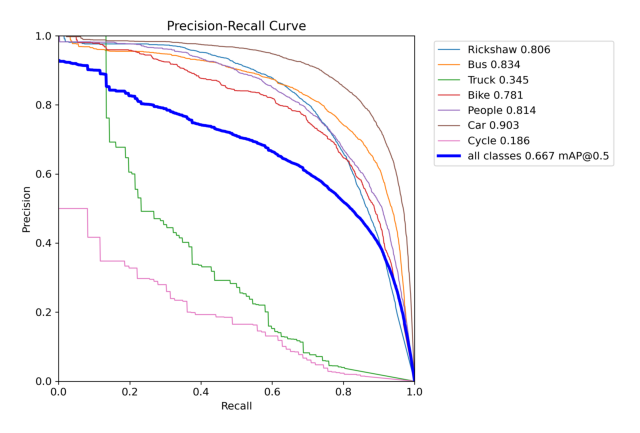

In [34]:
# ============================================================
# 4. Visualize PR curve from custom folder
# ============================================================
pr_curve_file = list((OUTPUT_FOLDER/"val").glob("*PR_curve*.png"))[0]
img = mpimg.imread(pr_curve_file)
plt.figure(figsize=(8,6))
plt.imshow(img)
plt.axis('off')
plt.show()

   epoch      time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1   75.8753         1.43029         1.71831         1.22176   
1      2  151.0060         1.35945         1.22205         1.18593   
2      3  226.3280         1.33902         1.17701         1.18412   
3      4  301.1330         1.34986         1.16842         1.17135   
4      5  375.8540         1.31774         1.11597         1.16031   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.62826            0.52460           0.52448   
1               0.68664            0.53542           0.55110   
2               0.65038            0.51343           0.52407   
3               0.65332            0.50027           0.52406   
4               0.68417            0.54149           0.56060   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.27365       1.55506       1.22013       1.29415  0.000254   
1              0.29611       1.45665  

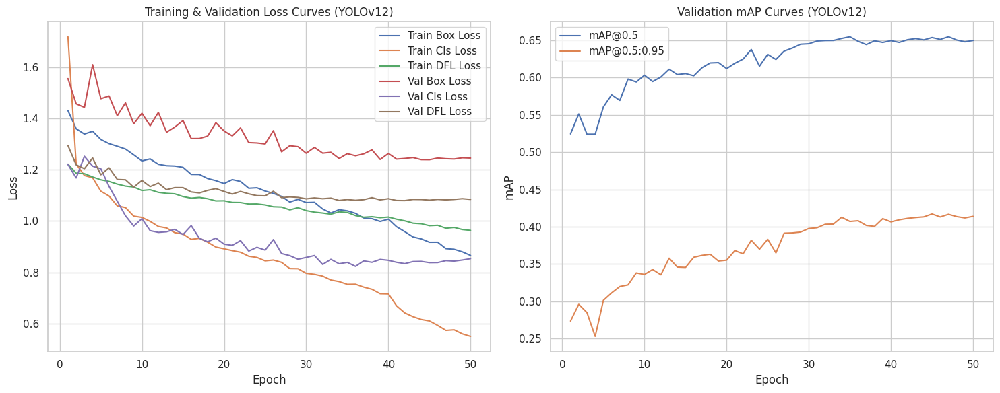

In [36]:
#................

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# ✅ Load YOLOv12 results CSV
df = pd.read_csv("/kaggle/working/runs/detect/yolo12s.pt/results.csv")

# Show first few rows to confirm available columns
print(df.head())

# Set style
sns.set(style="whitegrid")

# Create figure
plt.figure(figsize=(15,6))

# --- 1️⃣ Plot Training & Validation Loss ---
plt.subplot(1, 2, 1)
plt.plot(df['epoch'], df['train/box_loss'], label='Train Box Loss')
plt.plot(df['epoch'], df['train/cls_loss'], label='Train Cls Loss')
plt.plot(df['epoch'], df['train/dfl_loss'], label='Train DFL Loss')
plt.plot(df['epoch'], df['val/box_loss'], label='Val Box Loss')
plt.plot(df['epoch'], df['val/cls_loss'], label='Val Cls Loss')
plt.plot(df['epoch'], df['val/dfl_loss'], label='Val DFL Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss Curves (YOLOv12)')
plt.legend()
plt.grid(True)

# --- 2️⃣ Plot mAP curves (mean Average Precision) ---
plt.subplot(1, 2, 2)
plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP@0.5')
plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Validation mAP Curves (YOLOv12)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


   epoch      time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1   75.8753         1.43029         1.71831         1.22176   
1      2  151.0060         1.35945         1.22205         1.18593   
2      3  226.3280         1.33902         1.17701         1.18412   
3      4  301.1330         1.34986         1.16842         1.17135   
4      5  375.8540         1.31774         1.11597         1.16031   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.62826            0.52460           0.52448   
1               0.68664            0.53542           0.55110   
2               0.65038            0.51343           0.52407   
3               0.65332            0.50027           0.52406   
4               0.68417            0.54149           0.56060   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.27365       1.55506       1.22013       1.29415  0.000254   
1              0.29611       1.45665  

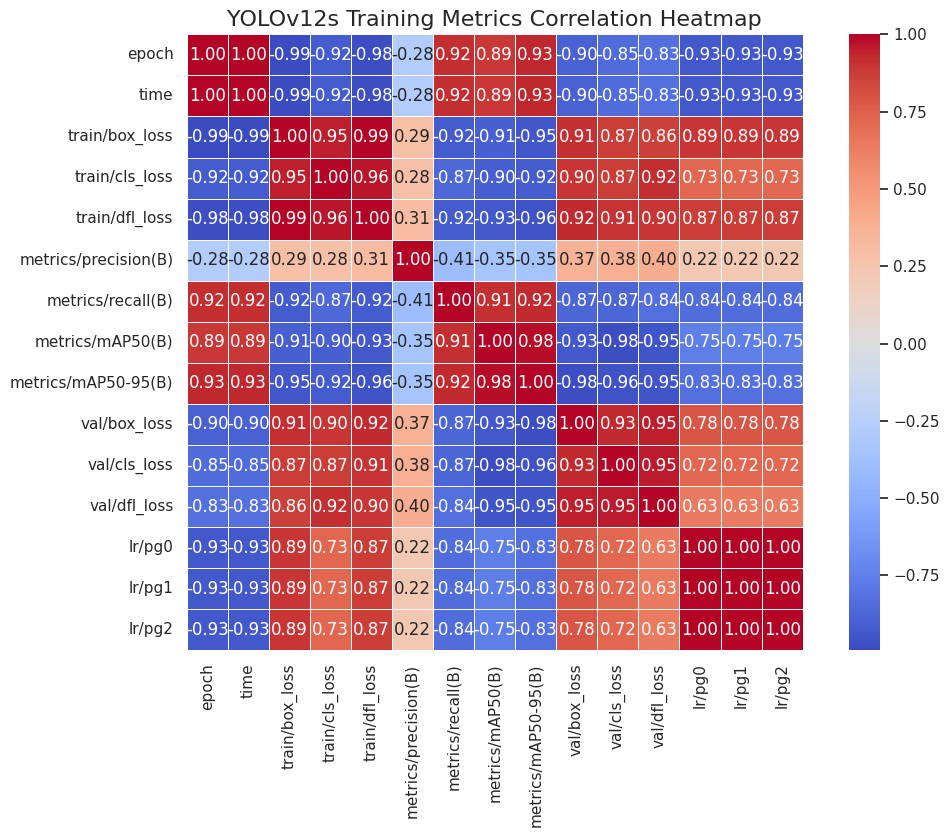

In [37]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your YOLOv12s training results
df = pd.read_csv("/kaggle/working/runs/detect/yolo12s.pt/results.csv")

# Show first few rows to confirm it's loaded
print(df.head())

# Compute correlation matrix
corr = df.corr()

# Set figure size
plt.figure(figsize=(12, 8))

# Create correlation heatmap
sns.heatmap(corr, 
            annot=True,         # show correlation values
            cmap='coolwarm',    # color scheme
            fmt=".2f",          # decimal format
            linewidths=0.5,     # thin lines between cells
            square=True)

# Add title
plt.title("YOLOv12s Training Metrics Correlation Heatmap", fontsize=16)

# Display the plot
plt.show()
